# Unified MDTF/GFDL/NCAR Analysis Notebook Template

More details on the development process:
[MDTF Planning Document](https://docs.google.com/document/d/1P8HqL8O5304qwR3ik9RmgFDwSWwlkPgOjnp39PIkLfY/edit?usp=sharing)

In [1]:
# Development mode: constantly refreshes module code
%load_ext autoreload
%autoreload 2

import importlib
import collections
import io
import sys
import yaml
import json
import os
from pathlib import Path

## Jupyter ESNB notebook POD settings
The ESNB framework is built upon the following procedures
### [Section: Prepare POD Settings](#Prepare-POD-Settings)
### [Section: Load Data from Catalog Files](#Load-Data-from-Catalog-Files)
### [Section: Diagnostics cells](#diagnostics)
### [Section: Results](#test_ref)

--------------

## Prepare POD Settings
- The following section sets up the mode of the Jupyter notebook ("interactive" or "prod"). The developer can either modify "settings_dict" and "case_info" here for a new POD or read the settings assigned for an existing POD (settings.jsonc)

- The required variables described in "case_info" will be loaded into xarray.datasets


In [2]:
# 
# Framework: Setup paths to import MDTF code as modules
#
module_path = os.path.abspath(os.path.join('../../'))  #Assumes the notebook is in MDTF-diagnostics/diagnostics/diagnostic_name/notebook_name
print(f"Using MDTF framework version {module_path}")
if module_path not in sys.path:
    sys.path.append(module_path)
from src import util              #, varlist_util, translation, xr_parser, units
from src.util import json_utils

Using MDTF framework version /scratch/wmtsai/mdtf_miniforge/MDTF-diagnostics


In [3]:
import esnb
from esnb import NotebookDiagnostic, RequestedVariable, CaseGroup2
os.environ["ESNB_LOG_LEVEL"] = "DEBUG"

In [4]:
# Define a mode (leave "prod" for now)
mode = "interactive"

# Verbosity
verbose = True

#### Settings: modify "settings_dict" when using the "interactive" mode 
- In interactive mode, modify settings_dict in the notebook to set the desired options before running the diagnostic.

- In prod mode, read all variables indicated in "the settings.jsonc" under your POD directory (i.e., "/MDTF-diagnostics/diagnostics/your_pod_name")

In [5]:
#### POD settings are defined here (interactive mode) or read
#### from the diagnostics/blocking_notebook/settings.jsonc file  

if (mode == "interactive"):
    settings_dict = {
    "settings": {

        # ---------------------------------------------------
        #The pod_env_vars are used in the POD, not required by the MDTF framework
        # ---------------------------------------------------
        "pod_options": {
            ## Options of running processes. Set "False" if this process has been completed before. 
            ## "experiment_name": "MPI-ESM1-2-HR_historical_r1i1p1f1.json",
            "run_mcs_identification": "True",
            "run_precip_statistics": "True",
            "plot_precip_statistics": "True",
            "run_buoyancy_calculation": "True",
            "run_buoyancy_statistics": "True",   
            "plot_buoyancy_statistics": "True",
            
            ## The time range of the MCS analysis. The MCS identification will generate files at 
            ## each timestep within this specified range, so consider 1-2 years to reduce computation and storage
            "start_time": "20050101.0600",
            "end_time": "20051231.1800",
            ## The latitude range: 
            "latitude_max": 30,
            "latitude_min": -30,
            ## The regridded resolution from the native resolution
            ## precipitation statistics, buoyancy 2-D histograms 
            "regrid_res": 1,
            ## The number of workers used for parallel computation. Recommended for high-resolution models (<= 0.5 deg.)
            ## Default is 8, which can be run on a general personal laptop.
            "num_workers": 8
        },
        
        # ---------------------------------------------------
        # The following settings are used by the MDTF framework
        # ---------------------------------------------------
        "runtime_requirements": {
            "python3": None,  # None means use the default python version of the MDTF framework
        },
        "driver": "mdtf.esnbtest.ipynb",
        "long_name": "Wei-Ming Tsai's MCS precipitation-buoyancy diagnostic",
        "convention": "cmip",
        "description": "Wei-Ming Tsai's MCS precipitation-buoyancy diagnostic", 
    },
    "dimensions": {
        "lat": {
                "standard_name": "latitude",
                "units": "degrees_north",
                "axis": "Y"
            },
        "lon": {
                "standard_name": "longitude",
                "units": "degrees_east",
                "axis": "X"
            },
        "plev": {
                "standard_name": "air_pressure",
                "units": "hPa",
                "positive": "down",
                "axis": "Z"
            },
        "time": {"standard_name": "time"}
    },

    ## In this section, you describe what model data your diagnostic uses. Add one
    ## list entry (the section in curly braces) for each variable, separated by
    ## commas.
    "varlist" : {
        ## Variable identifier. An environment variable with this name will be set
        ## to what the corresponding field is called in the model being analyzed.
        "pr": {
        "standard_name" : "precipitation_flux",
        "requirement": "required",
        "realm": "atmos",
        "units": "kg m-2 s-1",
        "frequency" : "6hr",
        "dimensions": ["time", "lat", "lon"]
        },
        "rlut": {
        "standard_name" : "toa_outgoing_longwave_flux",
        "requirement": "required",
        "realm": "atmos",
        "units": "W m-2",
        "frequency" : "6hr",
        "dimensions": ["time", "lat", "lon"]
        },
        "ta": {
                "standard_name": "air_temperature",
                "requirement": "required",
        "realm": "atmos",
                "units": "K",
        "frequency" : "6hr",
        "dimensions" : ["time", "plev", "lat", "lon"]
            },
            "hus": {
                "standard_name": "specific_humidity",
                "requirement": "required",
        "realm": "atmos",
        "frequency" : "6hr",
                "units": "kg/kg",
        "dimensions" : ["time", "plev", "lat", "lon"]
            }
    },
    }

    # ----------- suggested part WMT -------------
    # write out a settings.jsonc as a log, which is useful for tracking and implemented 
    # by functions defined for the command-line version MDTF framwork where they may
    # call the user-specified settings from the settings.jsonc 
    pod_dir = Path(os.getenv('CODE_ROOT')) / f'diagnostics/MCS_precip_buoy_stats'
    utils_dir = pod_dir / 'mcs_utils'
    work_dir = pod_dir / '../../../wkdir/MDTF_output/MCS_precip_buoy_stats' # i.e., /wkdir/MDTF_output/MCS_precip_buoy_stats
    # Resolve it to an absolute path to avoid confusion with relative jumps
    os.environ['WORK_DIR'] = str(work_dir.resolve())
    work_dir.mkdir(parents=True, exist_ok=True)

    out_file = work_dir / "settings.jsonc"
    with out_file.open("w", encoding="utf-8") as f:
        json.dump(settings_dict, f, indent=2, ensure_ascii=False)
    print(f"ESNB mode: {mode} .... write out the settings_dict specified above")
    print("Saved settings.jsonc:", out_file)


else:  # batch mode: running from the command line, read in the settings file
    import json

    # Specify the path to the JSONC file
    settings_file_path = "./settings.jsonc"

    try:
        # Open and read the JSONC file using MDTF framework's json_utils
        settings_dict = json_utils.read_json(settings_file_path)
    except Exception as e:
        print(f"An unexpected error occurred: {e}")
   

ESNB mode: interactive .... write out the settings_dict specified above
Saved settings.jsonc: /scratch/wmtsai/mdtf_miniforge/MDTF-diagnostics/diagnostics/MCS_precip_buoy_stats/../../../wkdir/MDTF_output/MCS_precip_buoy_stats/settings.jsonc


In [6]:
# Initialize the diagnostic from an existing MDTF settings file
diag = NotebookDiagnostic(settings_dict)

In [7]:
# Define a dictionary of variable name mappings.
# These will be used to rename the variables, but this is not required.
mapping = {
    "zg": "Z500",
}

#### Settings: modify "case_info" when using the "interactive" mode
- In interactive mode, modify case_info in the following cell to set the name of your case, catalog.json, and environment pathes before running the diagnostic.

- In prod mode, it will load the "runtime_config.yml" with the prescribed settings. 

In [8]:
#### setting the runtime_config.yml

if (mode == "interactive"):
    # If running in interactive mode, input case settings are made here. Otherwise they are read from the input settings file
    # This should contain everything in the input file. Extra key value pairs can be added in a later cell.
    case_info = {
     "case_list": {
            "MPI-ESM1-2-HR_historical_r1i1p1f1_gn": { #case name
                "convention": "CMIP",
                "enddate": "20051231180000",
                "model": "MPI-ESM1-2-HR",
                "startdate": "20050101060000",
                'frequency': '6hr'
            }
        },
        "DATA_CATALOG": "/scratch/wmtsai/mdtf_miniforge/catalogs/MPI-ESM1-2-HR_historical_r11i1p1f1.esnb.json",
        "OBS_DATA_ROOT": "/scratch/wmtsai/mdtf_miniforge/inputdata/obs_data",
        "WORK_DIR": "/scratch/wmtsai/mdtf_miniforge/wkdir",
        "OUTPUT_DIR": "/scratch/wmtsai/mdtf_miniforge/wkdir", #leaving blank will use the WORK_DIR
        "conda_env_root": "/scratch/wmtsai/conda/envs",
        "conda_root": "/scratch/wmtsai/conda",
        "large_file": False,
        "make_multicase_figure_html": False,
        "make_variab_tar": False,
        "micromamba_exe": "",
        "overwrite": True,
        "pod_list": ["MCS_precip_buoy_stats"],
        "run_pp": True,
        "save_pp_data": True,
        "save_ps": False,
        "translate_data": True,
        "user_pp_scripts": [""]
    }
else:
    # Receive a dictionary of case information from the framework. 
    # This needs to be passed from the MDTF framework (will be an argument to the command line call)"
    case_input_file =  "/scratch/wmtsai/mdtf_miniforge/MDTF-diagnostics/templates/runtime_config.MCS.yml"
    print("reading default settings from {case_input_file}")

    assert os.path.isfile(case_input_file), f"case environment file not found"
    with open(case_input_file, 'r') as stream:
        try:
            case_info = yaml.safe_load(stream)
        except yaml.YAMLError as exc:
            print(exc)

## Load Data from Catalog Files

In [9]:
# Provide an MDTF case settings file
groups = [
    CaseGroup2(
        case_info,
        date_range=("2005-01-01", "2005-12-31"),
        #mapping=mapping,
    )
]

In [10]:
# The metadata for the case 
groups[0]

source,"{'case_list': {'MPI-ESM1-2-HR_historical_r1i1p1f1_gn': {'convention': 'CMIP', 'enddate': '20051231180000', 'model': 'MPI-ESM1-2-HR', 'startdate': '20050101060000', 'frequency': '6hr'}}, 'DATA_CATALOG': '/scratch/wmtsai/mdtf_miniforge/catalogs/MPI-ESM1-2-HR_historical_r11i1p1f1.esnb.json', 'OBS_DATA_ROOT': '/scratch/wmtsai/mdtf_miniforge/inputdata/obs_data', 'WORK_DIR': '/scratch/wmtsai/mdtf_miniforge/wkdir', 'OUTPUT_DIR': '/scratch/wmtsai/mdtf_miniforge/wkdir', 'conda_env_root': '/scratch/wmtsai/conda/envs', 'conda_root': '/scratch/wmtsai/conda', 'large_file': False, 'make_multicase_figure_html': False, 'make_variab_tar': False, 'micromamba_exe': '', 'overwrite': True, 'pod_list': ['MCS_precip_buoy_stats'], 'run_pp': True, 'save_pp_data': True, 'save_ps': False, 'translate_data': True, 'user_pp_scripts': ['']}"
date_range,"('2005-01-01', '2005-12-31')"
concat_dim,None
is_resolved,False
is_loaded,False
plot_color,None
cases,[CaseExperiment2(MPI-ESM1-2-HR_historical_r1i1p1f1_gn)]


In [11]:
# Combine the experiments with the diag request and determine what files need to be loaded:
diag.resolve(groups)

In [12]:
# Open the files as xarray datasets
diag.open()

In [13]:
# Now the case is resolved and loaded after running the above two cells 
groups[0]

CaseGroup MPI-ESM1-2-HR_historical_r1i1p1f1_gn <>  resolved=True  loaded=True

### END OF ESNB DATA PREPROCESSING 
-----------------------

## Section: Diagnostics Cells
<a id='diagnostics'></a>

## MCS precipitation-buoyancy statistics
This POD provides diagnostics of tropical mesoscale convective systems (MCSs) and their thermodynamic environments,
informed by an empirical buoyancy measure (<em>B</em><sub>L</sub>). Specifically, these diagnostics are designed to evaluate model
performance in representing basic spatial-temporal characteristics of tropical MCSs and associated precipitation responses to the buoyancy measure under MCS and non-MCS conditions. The diagnostics include:
- Tropical-mean precipitation
- MCS frequency and its contribution to total precipitation
- Sensitivity of precipitation to individual buoyancy components, evaluated separately for MCS and non-MCS conditions
------------------------------------------
### About the POD
A minimum of one year of data at 3-hourly temporal resolution is recommended to ensure a sufficient sample size of tropical MCSs.
- This POD is designed for models with relatively high horizontal resolution (≤ 0.5°). Conservative regridding is applied by default to ensure consistent comparisons between model outputs and the observational reference (GPM-IMERG + ERA5).
- Detailed descriptions of the POD are documeneted in "diagnostics/MCS_precip_buoy_stats/doc/MCS_precip_buoy_stats.rst"
-------------------------------------------

**Required Variables (settings.jsonc)**

- 3-D variables: air temperature (ta), specific humidity (hus)
- 2-D variables: precipitation flux (pr), and TOA outgoing longwave radiation (rlut) 
- 3-D data structure (tilme, plev, lat,, lon) / 2-D data structure (time, lat, lon)

| Required Variables | Data Frequency |
|---|---|
| MCS identification: **pr**, **rlut** | Snapshots or short averages (< 6 hr), not dependent on sampling frequency |
| Low-tropospheric buoyancy: **ta**, **hus** | Corresponding times at which MCSs are identified |

**Minimum Data Requirement**

- Length: at least one year of 3-hourly data to ensure sufficient tropical MCS sampling. (Observational reference is based on 10-year data)
- Resolution: higher horizontal resolution (≤ 0.5°) is recommended. 

**Information of Output Data** 

- The estimate of data size for the high frequency outputs (1-year, 3-hrly, ~0.5 degree) is about 8 GB per year. 
- The condensed statistics (monthly, regridded data) is about 100 MB per year. 
- Users may choose to retain high-frequency outputs or keep only condensed statistics to save storage. 


In [14]:
# ****NOTE****** numba is required for the POD. Install that unde the "esnb" enviroment
#!pip install numba
#!pip install json5
#!pip install cartopy
#!pip install xesmf=0.8.9
#!conda install -c conda-forge esmpy -y
#!pip install numpy==1.26.4 # The original is 2.4.2, which is not compatible with esmpy...

# *** NOTE ***** specify versions for xesmf, esmpy and esmf to avoid ESMF errors.. missing functions  
## !conda config --set channel_priority strict
# !conda install -c conda-forge "xesmf=0.8.7" "esmpy=8.8.1" "esmf=8.8.1=nompi*"

# solution: using DOCKER to save a "snapshot" of the environment as a pod-specified one, which will be used whenever
# a future user open the ESNB notebook and run the codes. This approach is applied to individual PODs for clear controls 


In [15]:
# WMT add pathlib package
import xarray as xr
import subprocess 

### merge all data and specify the analyzed region (defualt: -30 to 30 in latitude)
lat_max = float(settings_dict['settings']['pod_options']['latitude_max'])
lat_min = float(settings_dict['settings']['pod_options']['latitude_min'])
ds_merged = xr.merge(diag.datasets).sel(lat=slice(lat_min, lat_max))

/tmp/ipykernel_3505982/3555409347.py:8: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  ds_merged = xr.merge(diag.datasets).sel(lat=slice(lat_min, lat_max))


In [16]:
pod_dir = Path(os.getenv('CODE_ROOT')) / f'diagnostics/MCS_precip_buoy_stats'
utils_dir = pod_dir / 'mcs_utils'
############### The work_dir path was generated by MDTF but not handled by ESNB ###############
work_dir = pod_dir / '../../../wkdir/MDTF_output/MCS_precip_buoy_stats' # i.e., /wkdir/MDTF_output/MCS_precip_buoy_stats
# Resolve it to an absolute path to avoid confusion with relative jumps
os.environ['WORK_DIR'] = str(work_dir.resolve())
##################################################
# Add utils to the system path to import modules saved under "/mcs_utils" 
sys.path.append(str(utils_dir))

### Step 1. MCS identification
Dentify 2-D MCS masks using a snapshot-based threshold method similar to PyFLEXTRKR (see ./doc/MCS_precip_buoy_stats.rst).
If you would like to implement pre-defined MCS masks from another source (e.g., tracked MCSs from a different tracker), you can follow the steps below:

1. Set run_mcs_identification = False, then create the directory "MDTF_output/model/netCDF/MCS_identifiers/". Make sure your files follow the directory structure (see ./doc/MCS_precip_buoy_stats.rst).

2. Each MCS data file must include these three variables:
- mcs_flag: 2-D binary MCS mask
- precipitation: precipitation rate (mm hr⁻¹)
- tb: brightness temperature (K)

3. Output directory: wkdir/MDTF_output/MCS_precip_buoy_stats/model/netCDF/MCS_identifiers/


In [17]:
# Call functions to identify 2-D snapshot-based MCSs
from process_PyFLEXTRKR_MCSmask_writeout_parallel import dask_write_cloudid_PyFLEXTRKR

In [18]:
# Run the execution looping over the specified years in the settings
# Subdaily outputs will be saved under your "MDTF_output/MCS_precip_buoy_stats/model/netCDF/MCS_identifiers"

if settings_dict['settings']['pod_options']['run_mcs_identification']:
    start_year = int(str(settings_dict['settings']['pod_options']['start_time'])[:4])
    end_year = int(str(settings_dict['settings']['pod_options']['end_time'])[:4])
    # Create "MCS_identifiers" directory and start identifying MCSs
    for year in range(start_year, end_year + 1):
        dask_write_cloudid_PyFLEXTRKR(ds_merged[['pr','rlut']], year)

Loading data into memory...
Pre-calculating TB and Pr...
Processing 1460 timesteps...
Done.


### Step 2. Calculate MCS-associated Precipitation Statistics
 - Requried steps: STEP 1
  1. This step writes out diagnostics outputs: MCS frequency, mean precip, accumulative precip, accumulative MCS precip, ... etc.

  2. Output directory: "/scratch/wmtsai/mdtf_miniforge/wkdir/MDTF_output/MCS_precip_buoy_stats/model/netCDF/stats" <br>
     File name: precip_mcsstats_regridded_monthly.$year.nc

In [19]:
# Run the codes outside ESNB to avoid multiprocessing issues in Jupyter notebook
# This execuation is identical to "python preocess_prmcs_stats_writeout.py" in terminal 

if settings_dict['settings']['pod_options']['run_precip_statistics']:
    subprocess.run([sys.executable, str(utils_dir / 'process_prmcs_stats_writeout.py')], check=True)

output saved as : /scratch/wmtsai/mdtf_miniforge/wkdir/MDTF_output/MCS_precip_buoy_stats/model/netCDF/stats/precip_mcsstats_regridded_monthly.2005.1deg.nc


### Step 3. Plot precipitaiton and MCS-associated maps 
- Requried steps: STEP 2 
1. This step generates diagnostics figures 
2. Output directory: ""MDTF_output/MCS_precip_buoy_stats/fig""

<xarray.Dataset> Size: 8GB
Dimensions:  (time: 1460, lat: 64, lon: 384, plev: 28)
Coordinates:
  * time     (time) object 12kB 2005-01-01 00:00:00 ... 2005-12-31 18:00:00
  * lat      (lat) float64 512B -29.45 -28.52 -27.58 ... 27.58 28.52 29.45
  * lon      (lon) float64 3kB 0.0 0.9375 1.875 2.812 ... 357.2 358.1 359.1
  * plev     (plev) float64 224B 1e+05 9.75e+04 9.5e+04 ... 1.25e+04 1e+04 5e+03
Data variables:
    pr       (time, lat, lon) float32 144MB dask.array<chunksize=(1, 64, 384), meta=np.ndarray>
    rlut     (time, lat, lon) float32 144MB dask.array<chunksize=(1, 64, 384), meta=np.ndarray>
    ta       (time, plev, lat, lon) float32 4GB dask.array<chunksize=(1, 14, 32, 192), meta=np.ndarray>
    hus      (time, plev, lat, lon) float32 4GB dask.array<chunksize=(1, 14, 32, 192), meta=np.ndarray>
Attributes: (12/48)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   0.0
    branch_time

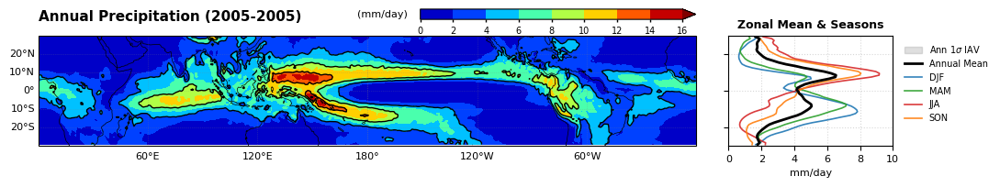

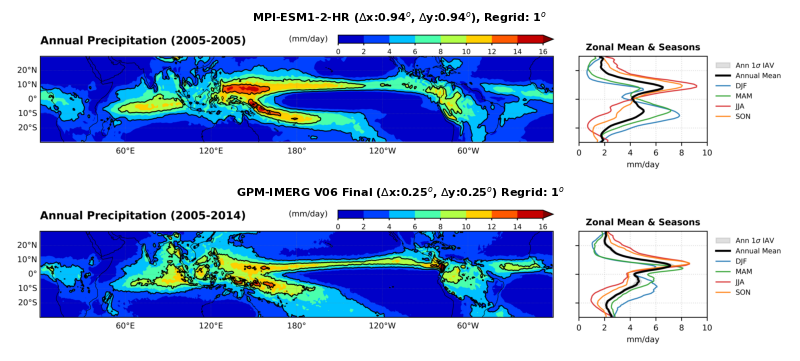

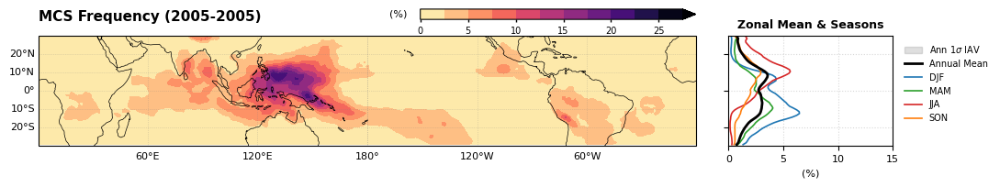

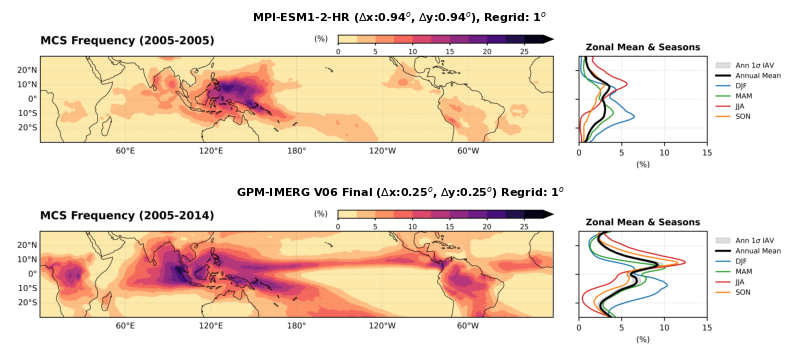

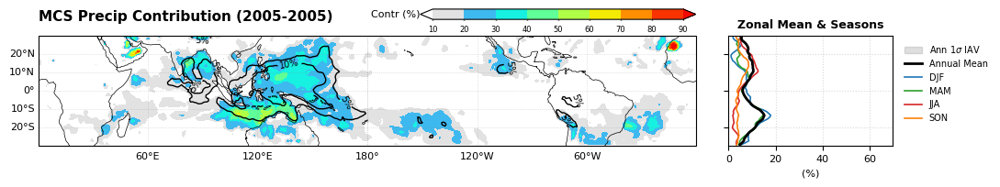

In [20]:
# Plot the resulting maps by import the associated function
import plot_precip_stats  

case_name = next(iter(groups[0].source['case_list']))
model_id = groups[0].source['case_list'][case_name]['model']

if settings_dict['settings']['pod_options']['plot_precip_statistics']:
    plot_precip_stats.main(ds_file=ds_merged, model_id=model_id)

### STEP 4: Calculate the Lower-Tropospheric Buoyancy 
- Required steps: N/A

1. This step calculates the two-layer buoyancy components: BL,CAPE and BL,SUBSAT (see ./doc/MCS_precip_buoy_stats.rst)

2. Output directory:  "wkdir/MDTF_output/MCS_precip_buoy_stats/model/netCDF/layer_averaged_thetae"<br>

##### Note: Generated files ~ 500 M per year given 1-deg. and 6-hourly resolutions: Users should be aware of available storage before running the POD. 

In [21]:
# Call functions that calculate the low-tropospheric buoyancy components and save monthly data

from process_layer_thetae_writeout import process_thetae_layers

if settings_dict['settings']['pod_options']['run_precip_statistics']:

    thetae_dir = work_dir / 'model/netCDF/layer_averaged_thetae/'
    thetae_dir.mkdir(parents=True, exist_ok=True)
    process_thetae_layers(ds_merged[['hus','ta']], thetae_dir, ntime=None,
                          num_workers=settings_dict['settings']['pod_options']['num_workers'])

Starting parallel processing for 1460 steps...
Merging into 12 monthly files...
Completed: layer_averaged_thetae_buoyancy.2005.01.nc
Completed: layer_averaged_thetae_buoyancy.2005.02.nc
Completed: layer_averaged_thetae_buoyancy.2005.03.nc
Completed: layer_averaged_thetae_buoyancy.2005.04.nc
Completed: layer_averaged_thetae_buoyancy.2005.05.nc
Completed: layer_averaged_thetae_buoyancy.2005.06.nc
Completed: layer_averaged_thetae_buoyancy.2005.07.nc
Completed: layer_averaged_thetae_buoyancy.2005.08.nc
Completed: layer_averaged_thetae_buoyancy.2005.09.nc
Completed: layer_averaged_thetae_buoyancy.2005.10.nc
Completed: layer_averaged_thetae_buoyancy.2005.11.nc
Completed: layer_averaged_thetae_buoyancy.2005.12.nc
Total time elapsed: 78.61s


### STEP 5: Calculate the 2-D histograms of Buoyancy Components and associated Precipitation 
- Required steps: STEP 4

This step generates the diagnostics 2-D histogram outputs under "MDTF_output/MCS_precip_buoy_stats/model/netCDF/stats"
- Joint histograms of BL,CAPE and BL,SUBSAT and conditional precipitation associated with different 
conditions: MCS, Non-MCS Deep, and others (see ./doc/MCS_precip_buoy_stats.rst)


In [22]:
# Run the calculation outside ESNB to avoid multiprocessing issues in Jupyter notebook.
if settings_dict['settings']['pod_options']['run_buoyancy_statistics']:
    subprocess.run([sys.executable, str(utils_dir / 'process_BLcapesubsat_regions_unified.multiprocess.py'),'ESNB'], check=True)

Reading settings.jsonc for ESNB
proceesing year:  2005
output saved as : /scratch/wmtsai/mdtf_miniforge/wkdir/MDTF_output/MCS_precip_buoy_stats/model/netCDF/stats/BLprec_2Dhist_mcs_combined.2005.1.0deg.nc
output saved as : /scratch/wmtsai/mdtf_miniforge/wkdir/MDTF_output/MCS_precip_buoy_stats/model/netCDF/stats/BLprec_2Dhist_deep_combined.2005.1.0deg.nc
output saved as : /scratch/wmtsai/mdtf_miniforge/wkdir/MDTF_output/MCS_precip_buoy_stats/model/netCDF/stats/BLprec_2Dhist_other_combined.2005.1.0deg.nc
Finished. Total Time: 26.85s


### STEP 6: Plot Joint Histograms and Conditional Precipitaiton 
- Required steps: STEP 5

This step generates the figure directory "MDTF_output/MCS_precip_buoy_stats/fig" and saves the 2-D hostogram figure

In [23]:
# Plot the resulting 2-D histogram by import the associated function
import plot_BLprecip_relations_2D 

case_name = next(iter(groups[0].source['case_list']))
model_id = groups[0].source['case_list'][case_name]['model']

if settings_dict['settings']['pod_options']['plot_buoyancy_statistics']:
    plot_BLprecip_relations_2D.main(ds_file=ds_merged, model_id=model_id, 
                                    regrid_res=settings_dict['settings']['pod_options']['regrid_res'])

Loading 1 files for mcs...
Loading 1 files for deep...
Loading 1 files for other...
output saved as: /scratch/wmtsai/mdtf_miniforge/wkdir/MDTF_output/MCS_precip_buoy_stats/fig/BLprecip_capesubsat_merged.ocean.png
Loading 1 files for mcs...
Loading 1 files for deep...
Loading 1 files for other...
output saved as: /scratch/wmtsai/mdtf_miniforge/wkdir/MDTF_output/MCS_precip_buoy_stats/fig/BLprecip_capesubsat_merged.land.png


# Model Diagnostics Results
<a id='results'></a>

In [24]:
# Call Image to load the figures into the Jupyter notebook
from IPython.display import Image

## Temporally-Averaged Total Precipitation 
Temporally-averaged precipitation intensity (mm/day) over the analysis period. Precipitation data has been first regridded into a given spatial resolution using the xesmf conservative remapping. The right panel indicates seasonal variations of the zonal mean.

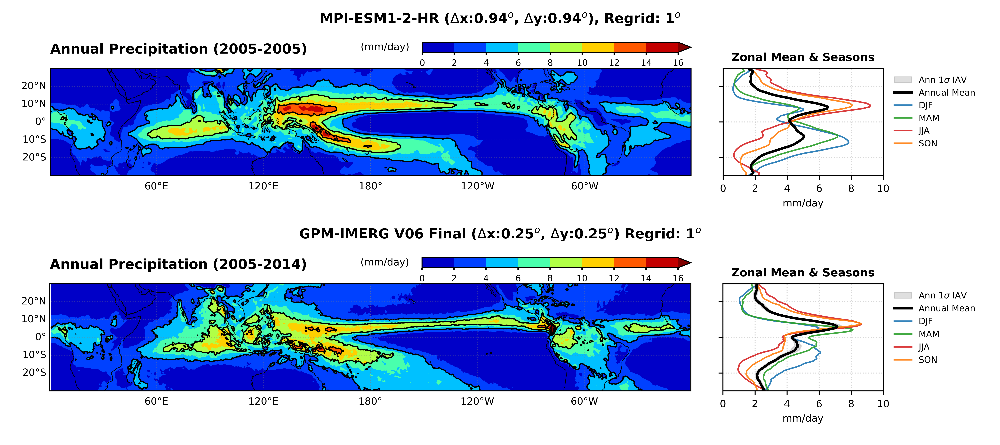

In [25]:
Image(filename=f'{module_path}/../wkdir/MDTF_output/MCS_precip_buoy_stats/fig/precipitation_climate.MODvsOBS.png')

## Tropical MCS Frequency and Precipitation Contribution

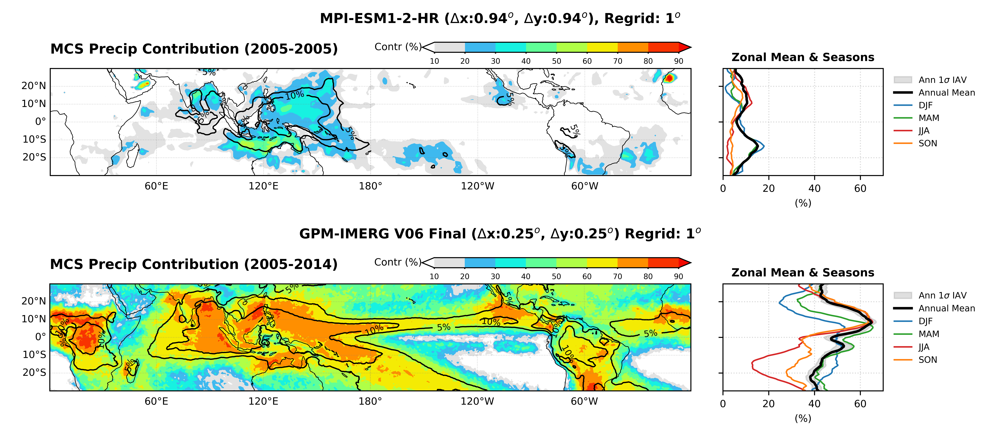

In [26]:
Image(filename=f'{module_path}/../wkdir/MDTF_output/MCS_precip_buoy_stats/fig/precipitation_MCScontribution.MODvsOBS.png')

Tropical MCS frequency (contours) and the contribution of MCSs to total precipitation (shading).
The MCS frequency is defined as the number of time steps with MCS occurrence normalized by the total number of time steps over the analysis period.	

# Sensitivity of Precipitation to Buoyancy Components, MCS vs. Non-MCS

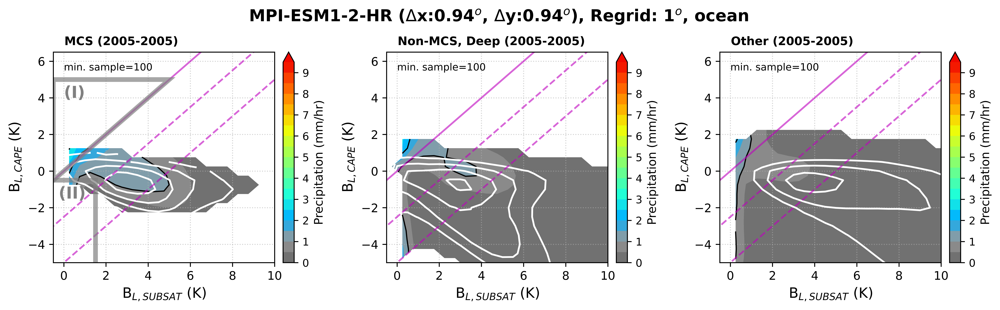

In [27]:
Image(filename=f'{module_path}/../wkdir/MDTF_output/MCS_precip_buoy_stats/fig/BLprecip_capesubsat_merged.ocean.png')

Conditionally-averaged precipitation rate binned by BL,cape and BL,subsat.
White contours indicate the joint probability (10x, x=-4,-3,-2). Bin cells with sample number less than 50 are masked out.
The bin width is 0.5 K for both axes. The slanted dashed lines indicate BL = 0, -2.5 and -5 K. Non-MCSs are cloud objects identified by a temperature threshold of < 241 K that fail to meet the 40,000 km² spatial extent requirement.

Precipitation sensitivity to BL,cape and BL,subsat for conditions associated with MCS, non-MCS deep, and others. For example, models tend to exhibit enhanced conditionally averaged precipitation when BL,subsat ≈ 0, while showing comparatively weak sensitivity to BL,cape. This behavior suggests that precipitation in models is triggered primarily under near-saturated lower-free troposphere, implying that convection parameterization schemes (where present) may play a reduced role relative to what is inferred from observations.

Two regimes (indicated by the triangle and rectangle) are highlighted: the highly buoyant regime (I), which typically exhibits a sharp enhancement of precipitation with increasing BL buoyancy, and the low-BL,cape, near-saturated regime (II), which is more commonly associated with stratiform precipitation.

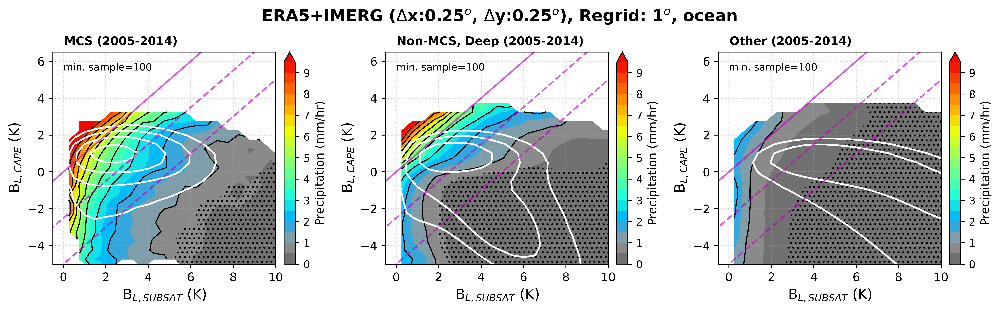

In [28]:
Image(filename=f'{module_path}/diagnostics/MCS_precip_buoy_stats/doc/BLprecip_capesubsat_merged_2005-2014.ocean.png')

## Exploring Datasets by Looping Over Variables

In [ ]:
# First loop over variables, and then over groups

for variable in diag.variables:
    for group in variable.datasets.keys():
        ds = variable.datasets[group]
        print("\n")
        print(f"Variable={variable}, Group={group}")
        print(ds)

## Exploring Datasets by Looping over Groups
<a id='test_ref'></a>

In [ ]:
# First loop over groups, and then over variables

for group in diag.groups:
    for variable in group.datasets.keys():
        ds = group.datasets[variable]
        print("\n")
        print(f"Variable={variable}, Group={group}")
        print(ds)